# Assigment

The following notebook contains the base architecture for the assignment.

The task is to complete the missing parts, explore the datasets and build two simple binary classifier, one which consists only of fully connected layers and one which also incorporates convolutional and max-pooling layers.

Only numpy is allowed to implement the classes! (Matplotlib and other modules can be used for visualization and data exploration.)

**Due date:** 2019 december 3

## Neptun Code - V249C6
## Maksim Kumundzhiev

In [411]:
import numpy as np
import logging

# Optimizers

In [ ]:
class Optimizer:
    def update(self, param, grad):
        pass
  
    def __call__(self, param, grad):
        self.update(param, grad)
  
  
class SGD(Optimizer):
    def __init__(self, learning_rate):
        self.learning_rate = learning_rate
  
    def update(self, param, grad):
        '''Gradient Descent Update
        This function updates the given 'param' using the 'grad' (gradients). 
        Note #1: Use the learning_rate. 
        Note #2: There are no return values.
        :param param: Parameters of the layer.
        :param grad: Corresponding gradients.
        '''
        return param - self.learning_rate * grad

# Weight Initializers

In [407]:
class WeigthInitializer:
    def initialize(self, size):
        return np.ones(size, dtype=np.float)
        
    def __call__(self, size):
        return self.initialize(size)
    
class RandomInitializer(WeigthInitializer):
    def __init__(self, shift=-0.5, scale=0.2):
        self.shift = shift
        self.scale = scale
    
    def initialize(self, size):
        '''Random number initializer
        Note #1: 'self.scale' specifies the range of the values and with 'self.shift' they can be shifted.
        Note #2: By default (with scale=0.2 and shift=-0.5) it should return a matrix which contains random values between -0.1 and 0.1. 
        Note #3: Use the np.random modul!
        :param size: Dimensions of the matrix.
        :returns: A matrix of random numbers with dimensions specified by 'size'. 
        '''
        result = np.random.normal(0.0, self.scale * (-1) * self.shift, size)
        return result

# Function class

In [408]:
class Function:
    def forward(self, input):
        return None  
  
    def __call__(self, input):
        return self.forward(input)
  
    def backward(self, grads):
        return None

## Activation functions

In [410]:
class Activation(Function):
    def __init__(self):
        pass

    
class Linear(Activation):
    def forward(self, z):
        return z.astype(np.float)

    def backward(self, z):
        return np.ones_like(z, dtype=np.float)

    
class Relu(Activation):
    def forward(self, z):
        '''Forward pass of the Rectified Linear Unit activation function.
        :param z: Input tensor.
        :returns: ReLU(z), see the lecture notes for the definition. 
        '''
        return np.max(0, z)

    def backward(self, z):
        '''Backward pass of the Rectified Linear Unit activation function.
        :param z: Input tensor.
        :returns: ReLU'(z), see the lecture notes for the definition. 
        '''
        return (1 if z >=0 else 0)

class Sigmoid(Activation):
    def forward(self, z):
        '''Forward pass of the Sigmoid activation function.
        :param z: Input tensor.
        :returns: sigmoid(z), see the lecture notes for the definition. 
        '''
        return (1 / (1 + np.exp(-z)))
  
    def backward(self, z):
        '''Backward pass of the Sigmoid activation function.
        :param z: Input tensor.
        :returns: sigmoid'(z), see the lecture notes for the definition. 
        '''
        return (1 / (1 + np.exp(-z)) * (1 - 1 / (1 + np.exp(-z))))

## Loss functions

In [412]:
class Loss(Function):
    def forward(self, y_true, y_pred):
        return None
  
    def __call__(self, y_true, y_pred):
        return self.forward(y_true, y_pred)
  
    def backward(self, y_true, y_pred):
        return None
  
  
class BinaryCrossentropy(Loss):
    def forward(self, y_true, y_pred):
        '''Forward pass of the Binary Crossentropy loss.
        Note: Both 'y_true' and 'y_pred' contains a batch of labels => y_true.shape == y_pred.shape == <batch size> x 1 
        :param y_true: Ground truth labels.
        :param y_pred: Predicted labels.
        :returns: Binary crossentropy loss, see the lecture notes for the definition. 
        '''
        logging.warning(y_true.shape == y_pred.shape)
        
        return np.mean(-1 * y_true * np.log10(y_pred) - (1 - y_true) * np.log10(1 - y_pred))  
  
    def backward(self, y_true, y_pred):
        '''Backward pass of the Binary Crossentropy loss.
        Note #1: The gradient should have the same shape as y_pred (<batch size> x 1) 
        Note #2: Keep in mind that the derivative of the loss in the lecture notes is for a logistic regression model. 
        Note #3: Here, you do not need to derive respect to the weights! 
        :param y_true: Ground truth labels.
        :param y_pred: Predicted labels.
        :returns: Derivative of the binary crossentropy loss, see the lecture notes for the "definition". 
        '''
        backward_result = (y_true * (y_pred - 1) + (1 - y_true) * y_pred).reshape(y_true.shape[0], 1)        
        
        return backward_result

## Layers

In [413]:
class Layer(Function):
    def __init__(self, activation, optimizer=None, weight_init=RandomInitializer(), *args, **kwargs):
        self.activation = activation
        self.optimizer = optimizer
        self.weight_init = weight_init
  
    def _forward(self, x):
        return None
  
    def forward(self, X):
        self.X = X
        self.Z = self._forward(X)
        self.h = self.activation(self.Z)
        return self.h
  
    def _backward(self, dZ):
        return None, None
  
    def backward(self, dh):
        dZ = dh * self.activation.backward(self.Z)
        self.dX, self.grads = self._backward(dZ)
        self._update_weights()
        return self.dX
  
    def _update_weights(self):
        assert len(self.params) == len(self.grads)
        for idx in range(len(self.params)):
            self.optimizer(self.params[idx], self.grads[idx])
            logging.log("Before optimizer update with idx: {0},  {1}".format(str(idx), str(self.params[idx])))
        self.W = self.optimizer.update(self.W, self.grads[0])
        self.b = self.optimizer.update(self.b,self.grads[1])
        logging.log("AFTER optimizer update with idx: {0}  {1}".foramt(str(idx), str(self.params[idx])))

### Fully-connected (dense) layer

In [417]:
class Dense(Layer):
    def __init__(self, size, *args, **kwargs):
        super(Dense, self).__init__(*args, **kwargs)
        self.W = self.weight_init(size)
        self.b = self.weight_init((1, size[1]))
        self.params = [self.W, self.b]
    
    def _forward(self, X):
        '''Forward pass of the dense layer.
        Note #1: Use self.W and self.b
        Note #2: Input times weight add a bias ==> activate is already taken care of! (see self.forward())
        :param X: Input matrix
        :returns: Linear combination, see the lecture notes for the definition.
        '''
        return np.dot(X,self.W) + self.b

    def _backward(self, dZ):
        '''Backward pass of the dense layer.
        Note: Use self.X
        :param dZ: Gradient of the subsequent layer.
        :returns: A pair (dX and [dW, db]) which contains the partial derivatives respect to the input and to the parameters (W and b). See the lecture notes for the "definition".
        '''
        dW = np.dot(self.X.T, dZ)
        db = dz.mean(axis = 0)  
        dX = np.dot(dz, self.W.T)
        return (dX, [dW, db])

### Flatten

In [418]:
class Flatten(Layer):
    def __init__(self, *args, **kwargs):
        super(Flatten, self).__init__(activation=Linear(), *args, **kwargs)
  
    def _forward(self, X):
        return X.reshape((len(X), -1))

    def _backward(self, dZ):
        return dZ.reshape(self.X.shape), []
  
    def _update_weights(self):
        pass

### Max pooling

In [ ]:
class Maxpool2d(Layer):
    def __init__(self, *args, **kwargs):
        super(Maxpool2d, self).__init__(activation=Linear(), *args, **kwargs)
  
    def _forward(self, X):
        '''Forward pass of the max pooling layer.
        :param X: Input matrix
        :returns: Matrix (<batch_size> x <height>//2 x <width>//2 x <n_channels>) after max pooling, see the lecture notes for the definition.
        '''
        batch_size = X.shape[0]
        batch_chunk = np.zeros((batch_size,int(X.shape[1]/2),int(X.shape[2]/2),X.shape[3]))
    
        for batch in range(batch_size):
            for i in range(X.shape[3]):
                r2 = 0
                for j in np.arange(0, X.shape[1],2):
                    k2 = 0
                    for k in np.arange(0, X.shape[2],2):
                        batch_chunk[batch, r2, k2, i] = np.max(X[batch,j:j+2, k:k+2, i])
                        k2 += 1
                r2+ = 1

        self.mask = X
        return batch_chunk

    def _backward(self, dZ):
        '''Backward pass of the max pooling layer.
        Note: Use self.mask too.
        :param dZ: Gradient of the subsequent layer.
        :returns: A pair (dX and []) which contains the partial derivative respect to the input and an empty list. See the lecture notes for the "definition".
        '''
        X_forward = self.mask
        dX = np.zeros(X_prev.shape)
    
        batch_size, X_height, X_width, X_channels = X_forward.shape
        batch_size, Z_height, Z_width, Z_channels = dZ.shape
        
        for i in range(batch_size):          
            x = X_forward[i]
            for height in range(Z_height):                   
                for width in range(Z_width):               
                    for corner in range(Z_channels):     
                        StartV = height
                        EndV = StartV + 2
                        StartH = width
                        EndH = StartH + 2
                        x_prev_slice = x[StartV:EndV, StartH:EndH, corner]
                        mask = x_prev_slice == np.max(x_prev_slice)
                        dX[i, StartV:EndV, StartH:EndH, corner] += np.multiply(mask, dZ[i, height, width, corner])
        return (dX, [])
  
    def _update_weights(self):
        pass

### Convolutional layer

In [420]:
class Conv2d(Layer):
  def __init__(self, kernel_size, n_channels, n_kernels, pad, use_fast=False, *args, **kwargs):    
    super(Conv2d, self).__init__(*args, **kwargs)
    self.W = self.weight_init((kernel_size, kernel_size, n_channels, n_kernels))
    self.b = self.weight_init((1, 1, 1, n_kernels))
    self.params = [self.W, self.b]
    self.pad = pad
    self.use_fast = use_fast
  
  def _convolution_fast(self, Y):
    '''Optimized version of the convolution operation (Optional).
    Note #1: Use self.X, self.X_padded, self.W
    Note #2: There are no return values.
    Note #3: It's an optional task.
    :param Y: Destination (output) matrix (image), see the lecture notes for the "definition". 
    '''    
    
  def _convolution_slow(self, Y):
    '''Naive version (with a bunch of for loops) of the convolution operation.
    Note #1: Use self.X, self.X_padded, self.W
    Note #2: There are no return values.
    Note #3: Both convolution and cross-correlation is acceptable.
    :param Y: Destination (output) matrix (image), see the lecture notes for the "definition". 
    '''    
    batch_size = self.X_padded.shape[0]
    Y_height = Y.shape[1]
    Y_width = Y.shape[2]
    Y_kernels = self.W.shape[3]
    X_channels = self.W.shape[2]
    W_height = self.W.shape[1]
    W_width = self.W.shape[2]
    
    for batch in range(batch_size):
      for height in range(Y_height):
        for width in range(Y_width):
          for k in range(Y_kernels):            
            for corner in range(X_channels):
              for a in range(W_height): 
                for b in range(W_width): 
                  Y[batch,height,widht,k] = Y[batch,height,width,k] + self.X_padded[batch,height+a,widht+b,corner] * self.W[a,batch,corner,k]

  def _forward(self, X):
    y_height = X.shape[1] - self.W.shape[0] + 2*self.pad + 1
    y_width = X.shape[2] - self.W.shape[1] + 2*self.pad + 1
    Y = np.zeros((X.shape[0], y_height, y_width, self.W.shape[3]), dtype=np.float16)
    
    if 0 < self.pad:
        X_padded = np.pad(X, self.pad, mode='constant')  
    else:
        X_padded = X
    self.X_padded = X_padded
    
    if self.use_fast:
        self._convolution_fast(Y)
    else:
        self._convolution_slow(Y)
    
    Y += self.b
    return Y
  
    def _backward_fast(self, dZ):
        '''Optimized version of the backward pass (Optional).
        Note #1: Use self.X, self.X_padded, self.W
        Note #2: It's an optional task.
        :param dZ: Gradient of the subsequent layer.
        :returns: A pair (dX, dW and db) which contains the partial derivatives respect to the input and to the parameters (W and b). See the lecture notes for the "definition".
        '''    
        pass
    #    db = None  # None optional
    #    dW = None  # None optional
    #    dX = None  # None optional
    #    return dX, dW, db


  def _backward_slow(self, dZ):
    '''Naive version (with a bunch of for loops) of the backward pass.
    Note: Use self.X, self.X_padded, self.W
    :param dZ: Gradient of the subsequent layer.
    :returns: A pair (dX, dW and db) which contains the partial derivatives respect to the input and to the parameters (W and b). See the lecture notes for the "definition".
    ''' 
    dX = np.zeros_like(self.X)
    dW = np.zeros_like(self.W)
    db = np.zeros_like(self.b)
    db = np.sum(dZ, axis=(0, 1, 2))
    
    batch_size = self.X_padded.shape[0]
    Y_height = self.X_padded.shape[1] - 2
    Y_width = self.X_padded.shape[2] - 2
    Y_kernels = self.W.shape[3]
    X_channels = self.W.shape[2]
    W_height = self.W.shape[0]
    W_width = self.W.shape[1]
    
    
    for b in range(batch_size):       
        for k in range(Y_kernels):   
            for h in range(Y_height): 
                for w in range(Y_width):
                  
                    for c in range(X_channels):
                        for a in range(W_height):
                            for b in range(W_width):
                                dW[a,b,c,k] += self.X_padded[b,h+a, w+b,c] * dZ[b, h, w, c]
    
    
    dZpad = np.pad(dZ, ((0,),(W_width-1, ), (W_height-1,), (0,)), 'constant')
    dXpad = np.pad(dX, ((0,),(self.pad, ),(self.pad,), (0,)), 'constant')
    
    w_ = np.zeros_like(self.W)
    for i in range(W_height):
        for j in range(W_width):
            w_[i,j,:,:] = w_[W_height-i-1,W_width-i-1,:,:]
            
    for b in range(batch_size):       
        for k in range(Y_kernels):   
            for h in range(Y_height+2*self.pad): 
                for w in range(Y_width+2*self.pad): 
                    for a in range(W_height): 
                        for b in range(W_width):
                            for c in range(X_channels): 
                                dXpad[b,h,w,c] += dZpad[b, h+a, w+b, k] * w_[a, b, c, k]
    
    dX = dXpad[:,self.pad:-self.pad,self.pad:-self.pad,:]
    return dX, dW, db
  
  def _backward(self, dZ):
    if self.use_fast:
      dX, dW, db = self._backward_fast(dZ)
    else:
      dX, dW, db = self._backward_slow(dZ)

    return dX, [dW, db]    

# Model class

In [ ]:
import matplotlib.pyplot as plt
class Model:
    def __init__(self, layers=None, loss=None, optimizer=None):
        self.layers = []
        if layers is not None:
            self.layers = layers
        self.loss = loss
        self.optimizer = optimizer
        
    def add(self, layer):
        assert isinstance(layer, Layer)
        layer.optimizer = self.optimizer
        self.layers.append(layer)
  
    def train(self, x_train, y_train, n_epochs, batch_size, randomize=True, display=True):
        self.losses = []
        
    for epoch in range(n_epochs):
        idx_list = list(range(len(x_train)))
        if randomize:
            np.random.shuffle(idx_list)
        n_batches = (len(idx_list) + batch_size - 1) // batch_size
        loss = 0.
        
        for batch_idx in range(n_batches):
            data = x_train[idx_list[batch_idx * batch_size:(batch_idx + 1) * batch_size]]
        for l in range(len(self.layers)):
            data = self.layers[l].forward(data)
            
        data = np.reshape(data,data.shape[0])
        
        
        y_pred = data
        y_true = y_train[idx_list[batch_idx * batch_size:(batch_idx + 1) * batch_size]]
        batch_loss = self.loss(y_true, y_pred)
        loss += batch_loss

        grad_batch_loss = self.loss.backward(y_true,y_pred)
        for l in range(len(self.layers))[::-1]:
            grad_batch_loss = self.layers[l].backward(grad_batch_loss)

        print('Epoch {}/{}: loss: {}'.format(epoch+1, n_epochs, loss/n_batches))
        self.losses.append(loss / n_batches)
        if display:
            plt.plot(self.losses)
            plt.show()
  
  def predict(self, x_test, x_labels , display=True):
        data = x_test
        for l in range(len(self.layers)):
            data = self.layers[l].forward(data)
            print("test loss: {}".format(self.loss(x_labels,data)))

# Breast Cancer Wisconsin (Diagnostic) Dataset

For more information, see: https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+(Diagnostic)

For more understanding data formed in .csv file with names of fetures

In [ ]:
# !wget https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/wdbc.data
# !wget https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/wdbc.names    

In [ ]:
# import numpy as np
# filename = 'wdbc.data'

# with open(filename, 'r') as file:
#   lines = file.readlines()
  
# words = [line.split(',') for line in lines]
# data = words[:-1]

# features = [[float(item) for item in rec[2:]] for rec in data]
# features = np.array(features, dtype=np.float32)

# label_str_to_num = lambda label: 1. if label == 'M' else 0.
# labels = [label_str_to_num(rec[1]) for rec in data]
# labels = np.array(labels, dtype=np.float32)

# # removing records with missing features (if any feature == 0.)
# missing_features = np.any(features == 0., axis=1)
# features = features[~missing_features,:]
# labels = labels[~missing_features]

# print(features.shape)
# print(labels.shape)

In [7]:
import pandas as pd
data = pd.read_csv('data.csv')
data.drop('Unnamed: 32', axis=1, inplace=True)
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


## Data exploration and Pre-processing
Tasks:
* Print the distribution of the labels.
* Print the scales of each features. (min, max, avg, std)
* Randomly split the dataset to training and test sets. (Ratio should be 80-20.)
  * After splitting make sure that the distribution of the labels are similar. (Print the distribution of the labels.)
* Normalize the data by each feature. (Use Z-score standardization.)

* <s>Print the distribution of the labels.</s>

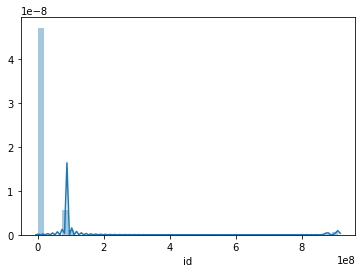

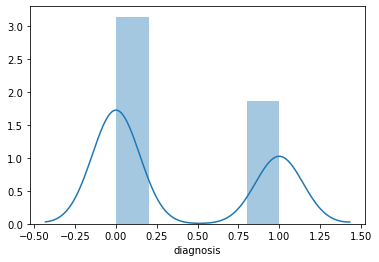

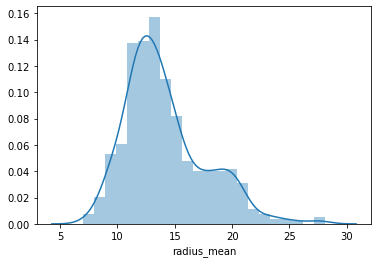

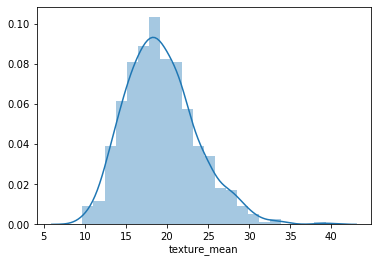

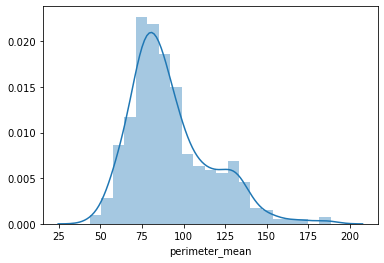

...

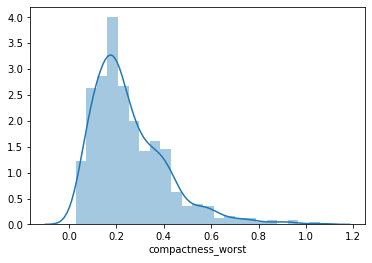

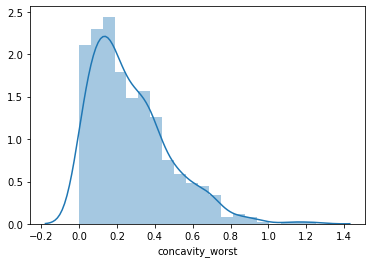

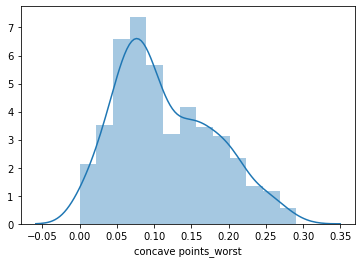

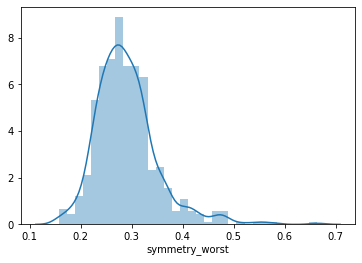

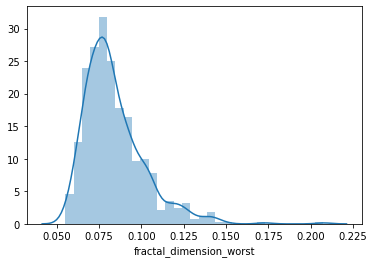

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

#Find Categorical columns in DataFrame 
[column_name for column_name in data.columns if (data['{}'.format(column_name)].dtype != 'float64') and data['{}'.format(column_name)].dtype != 'int']

#Replace categorical data with numerical
dic = {'M': 1, 'B': 0}
data['diagnosis'] = data['diagnosis'].map(dic)


#Check and replace NaN values with mean for DataFrame  
[data['{}'.format(column_name)].isna().value_counts() for column_name in data.columns]


#Plot distributions of columns(features)
for i, col in enumerate(data.columns):
    plt.figure(i)
    sns.distplot(data['{}'.format(col)])

* Plot distributions of labels

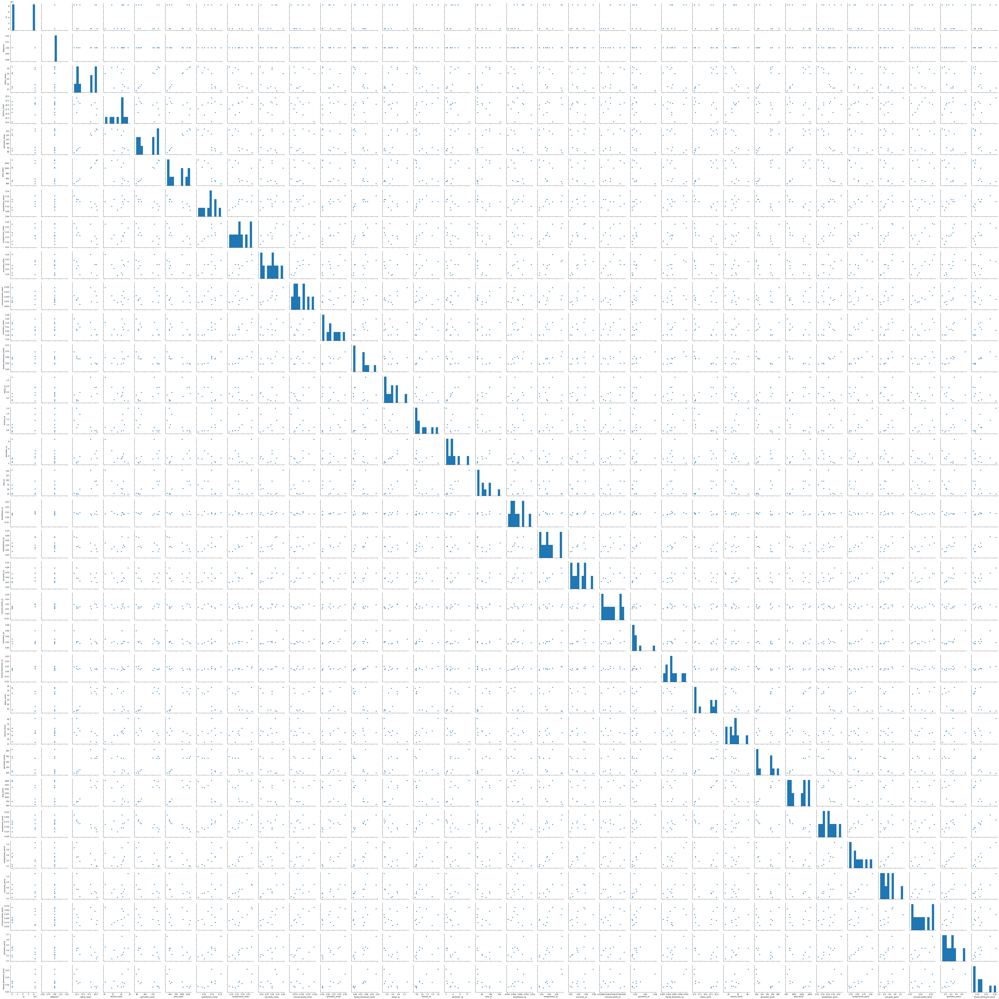

In [9]:
sns.pairplot(data[:10])

* <s>Print the scales of each features. (min, max, avg, std)</s>

In [10]:
data.describe()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,0.372583,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,0.483918,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,0.000000,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,0.000000,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,0.000000,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,1.000000,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,1.000000,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


* Randomly split the dataset to training and test sets. (Ratio should be 80-20.)
  * After splitting make sure that the distribution of the labels are similar. (Print the distribution of the labels.)

In [11]:
from sklearn.model_selection import train_test_split

y = data['diagnosis']
X = data.drop(['diagnosis'], axis=1)

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42, shuffle=True)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(455, 31) (114, 31) (455,) (114,)


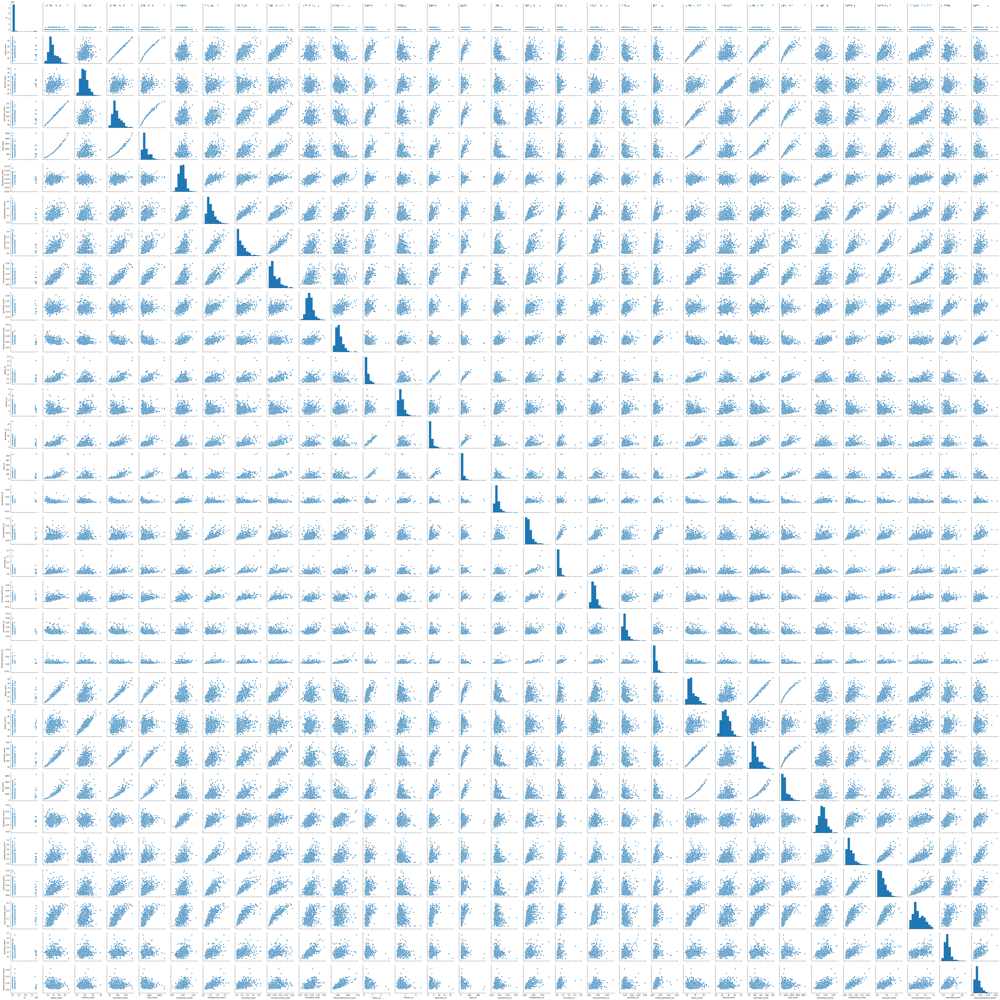

In [13]:
sns.pairplot(X)

* Normalize the data by each feature. (Use Z-score standardization.)

In [14]:
from scipy import stats
import numpy as np

X_train = np.array([stats.zscore(X_train['{}'.format(column_names)].values) for column_names in X_train.columns]).T
X_test = np.array([stats.zscore(X_test['{}'.format(column_names)].values) for column_names in X_test.columns]).T
print(X_train.shape, X_test.shape)


(455, 31) (114, 31)


## Define and train a model.
Tasks:
* Define a 2 layer fully-connected network:
  1. layer with 5 units and ReLU activation.
  2. layer with 1 units and Sigmoid activation.
* Train it for 500 epochs with a batch size of 16 using SGD optimizer with learning rate of 0.01.
* Plot the learning curve.
  * Summmarize in a few words what you see. (Presence of overfitting, underfitting, ...)
* Evaluate the trained model on the test set. (Loss, accuracy, precision, recall)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
dict_keys(['loss', 'accuracy', 'f1_m', 'precision_m', 'recall_m'])


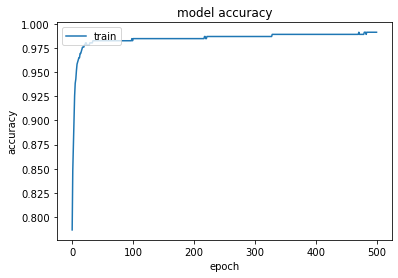

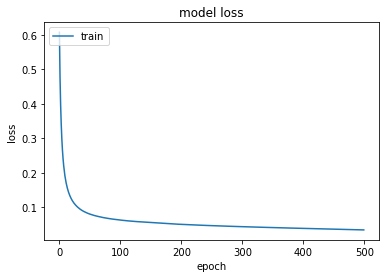

In [23]:
from keras.models import Sequential
from keras.layers import Dense, Activation
import keras

def recall_m(y_true, y_pred):
        true_positives = keras.backend.sum(keras.backend.round(keras.backend.clip(y_true * y_pred, 0, 1)))
        possible_positives = keras.backend.sum(keras.backend.round(keras.backend.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

def precision_m(y_true, y_pred):
        true_positives = keras.backend.sum(keras.backend.round(keras.backend.clip(y_true * y_pred, 0, 1)))
        predicted_positives = keras.backend.sum(keras.backend.round(keras.backend.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision * recall)/(precision + recall + keras.backend.epsilon()))


model = keras.Sequential([
    keras.layers.Dense(5, activation='relu', input_shape=(X_train.shape[1], )),
    keras.layers.Dense(1, activation='sigmoid')
])

sgd = optimizers.SGD(lr=0.01, decay=1e-6)
model.compile(optimizer=sgd, loss='binary_crossentropy', metrics=['accuracy',
                                                                  f1_m,
                                                                  precision_m,
                                                                  recall_m])

history = model.fit(X_train, y_train, epochs=500, batch_size=16, verbose=1)

# list all data in history
print(history.history.keys())

# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [24]:
loss, accuracy, f1_score, precision, recall = model.evaluate(X_test, y_test, verbose=0)
print(loss, accuracy, f1_score, precision, recall)

0.06278978165631231 0.9912280440330505 0.989130437374115 1.0 0.9791666865348816


# Triangles vs Circles (Basic Shapes Dataset)

For more information, see: https://www.kaggle.com/cactus3/basicshapes

In [25]:
# !curl -c ./cookie -s -L "https://drive.google.com/uc?export=download&id=1Va88vwMwmToi0SFfdTo8_9TJsV4qdOXK" > /dev/null
# !curl -Lb ./cookie "https://drive.google.com/uc?export=download&confirm=`awk '/download/ {print $NF}' ./cookie`&id=1Va88vwMwmToi0SFfdTo8_9TJsV4qdOXK" -o circles_vs_triangles_data.pkl

In [99]:
import pickle
from PIL import Image

with open('circles_vs_triangles_data.pkl', 'rb') as f:
    data = pickle.load(f)
features, labels = data['features'], data['labels']

In [220]:
data.keys(), features.shape, labels.shape

(dict_keys(['features', 'labels']), (200, 28, 28, 1), (200, 1))

## Data exploration and Pre-processing
Tasks:
* Print the distribution of the labels.
* Plot some images (3 circles and 3 triangles).
* Randomly split the dataset to training and test sets. (Ratio should be 80-20.)
  * After splitting make sure that the distribution of the labels are similar. (Print the distribution of the labels.)
* Normalize the data between -1. and 1. (Use min-max scaling.)

* Print the distribution of the labels.

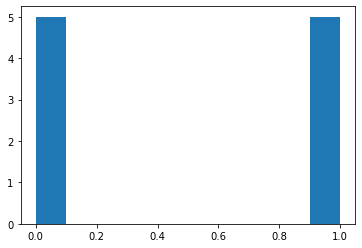

In [244]:
plt.hist(labels, normed=True);

In [260]:
zeroes = 0
ones = 0

for i in labels:
    if i == 0:
        zeroes += 1
    else:
        ones += 1

total = zeroes + ones        

print((zeroes/total) * 100, (ones/total) * 100)        

50.0 50.0


* Plot some images (3 circles and 3 triangles).

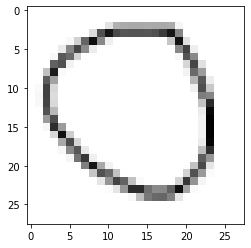

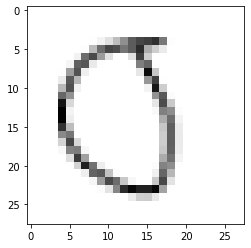

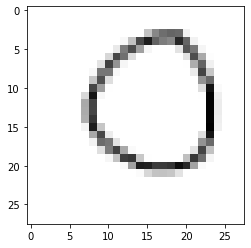

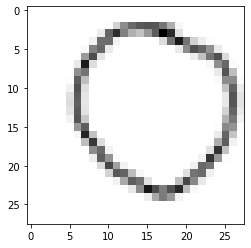

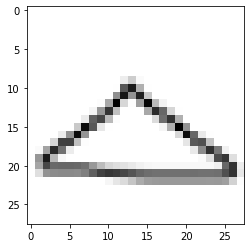

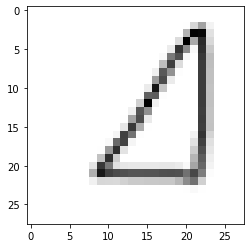

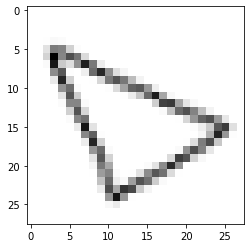

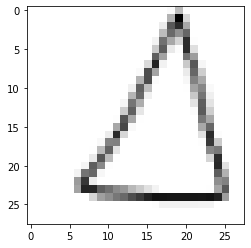

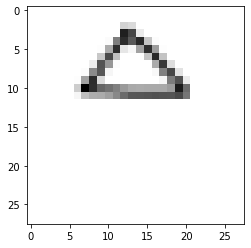

In [137]:
[(plt.show(), plt.imshow(Image.fromarray(features[index].reshape(28,28), 'L'), cmap='gray'))
 for index in range(96,105)];

* Randomly split the dataset to training and test sets. (Ratio should be 80-20.)
    * After splitting make sure that the distribution of the labels are similar. (Print the distribution of the labels.)

In [102]:
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=.2, random_state=42, shuffle=True)

In [103]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(160, 28, 28, 1) (40, 28, 28, 1) (160, 1) (40, 1)


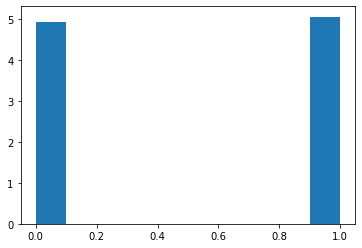

In [104]:
plt.hist(y_train, normed=True);

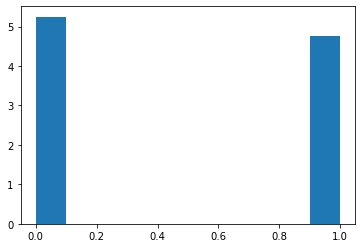

In [105]:
plt.hist(y_test, normed=True);

* Normalize the data between -1. and 1. (Use min-max scaling.)

In [138]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(160, 28, 28, 1) (40, 28, 28, 1) (160, 1) (40, 1)


In [275]:
X_train.shape

(160, 28, 28, 1)

In [389]:
scaler = MinMaxScaler(feature_range=(-1,1))
X_train_scaled = [scaler.fit_transform(X_train[i].reshape(-1,1)) for i in range(len(X_train))]
X_test_scaled = [scaler.transform(X_test[i].reshape(-1,1)) for i in range(len(X_test))]


#Test_scaled(for input use without shape)
#np.reshape(np.asarray(X_test_scaled), (40, 28,28,1)).shape

#Train_scaled (for input use without shape)
#np.reshape(np.asarray(X_train_scaled), (160, 28,28,1)).shape

## Define and train a model.
Tasks:
* Define a simple convolutional network as follows: 2x(Conv2D with 4 [then 8 in the second time] (3x3) kernels -> ReLU -> MaxPooling2D) -> Flatten -> Dense with 32 units -> Relu -> Dense -> Sigmoid
* Train it for 100 (or less if it is too slow...) epochs with a batch size of 16 using SGD optimizer with learning rate of 0.01.
  * Optional: Also train it with the optimized implementation, and measure the speed up. 
* Plot the learning curve.
  * Summmarize in a few words what you see. (Presence of overfitting, underfitting, ...)
* Evaluate the trained model on the test set. (Loss, accuracy, precision, recall)

In [390]:
def recall_m(y_true, y_pred):
        true_positives = keras.backend.sum(keras.backend.round(keras.backend.clip(y_true * y_pred, 0, 1)))
        possible_positives = keras.backend.sum(keras.backend.round(keras.backend.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

def precision_m(y_true, y_pred):
        true_positives = keras.backend.sum(keras.backend.round(keras.backend.clip(y_true * y_pred, 0, 1)))
        predicted_positives = keras.backend.sum(keras.backend.round(keras.backend.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision * recall)/(precision + recall + keras.backend.epsilon()))

In [391]:
np.random.seed(42)

def create_model(input_shape):
    model = Sequential()
    model.add(keras.layers.Conv2D(4, (3,3), activation='relu', input_shape=input_shape))
    model.add(keras.layers.MaxPool2D(2,2))
    model.add(keras.layers.Dropout(0.2))
    
    model.add(keras.layers.Conv2D(8, (3,3), activation='relu'))
    model.add(keras.layers.MaxPool2D(2,2))
    model.add(keras.layers.Dropout(0.2))
    
    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(32, activation='relu'))
    model.add(keras.layers.Dropout(0.4))
    model.add(keras.layers.Dense(1, activation='sigmoid'))


    sgd = optimizers.SGD(lr=0.01, decay=1e-6)
    model.compile(optimizer=sgd, loss='binary_crossentropy', metrics=['accuracy',
                                                                      f1_m,
                                                                      precision_m,
                                                                      recall_m])

    print(model.summary())
    return model


model = create_model(np.reshape(np.asarray(X_train_scaled)[0], (28,28,1)).shape)

Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_41 (Conv2D)           (None, 26, 26, 4)         40        
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 13, 13, 4)         0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 13, 13, 4)         0         
_________________________________________________________________
conv2d_42 (Conv2D)           (None, 11, 11, 8)         296       
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 5, 5, 8)           0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 5, 5, 8)           0         
_________________________________________________________________
flatten_18 (Flatten)         (None, 200)             

In [392]:
history = model.fit(np.reshape(np.asarray(X_train_scaled), (160, 28,28,1)), y_train, epochs=100, batch_size=16, verbose=1)

# list all data in history
print(history.history.keys())

Epoch 1/100
160/160 [==============================] - 0s 3ms/step - loss: 0.7817 - accuracy: 0.4812 - f1_m: 0.1060 - precision_m: 0.2583 - recall_m: 0.0741        
Epoch 2/100
160/160 [==============================] - 0s 313us/step - loss: 0.7156 - accuracy: 0.5250 - f1_m: 0.3356 - precision_m: 0.5083 - recall_m: 0.2629
Epoch 3/100
160/160 [==============================] - 0s 310us/step - loss: 0.7028 - accuracy: 0.5500 - f1_m: 0.5032 - precision_m: 0.6016 - recall_m: 0.4548
Epoch 4/100
160/160 [==============================] - 0s 319us/step - loss: 0.6991 - accuracy: 0.4875 - f1_m: 0.3995 - precision_m: 0.5033 - recall_m: 0.3414
Epoch 5/100
160/160 [==============================] - 0s 315us/step - loss: 0.6952 - accuracy: 0.4938 - f1_m: 0.3868 - precision_m: 0.5093 - recall_m: 0.3284
Epoch 6/100
160/160 [==============================] - 0s 306us/step - loss: 0.6711 - accuracy: 0.5688 - f1_m: 0.5252 - precision_m: 0.5880 - recall_m: 0.5077
Epoch 7/100
160/160 [===================

160/160 [==============================] - 0s 409us/step - loss: 0.6122 - accuracy: 0.6687 - f1_m: 0.6592 - precision_m: 0.6908 - recall_m: 0.6390
Epoch 53/100
160/160 [==============================] - 0s 411us/step - loss: 0.6252 - accuracy: 0.6750 - f1_m: 0.6778 - precision_m: 0.6679 - recall_m: 0.7068
Epoch 54/100
160/160 [==============================] - 0s 421us/step - loss: 0.6387 - accuracy: 0.6125 - f1_m: 0.6179 - precision_m: 0.6190 - recall_m: 0.6629
Epoch 55/100
160/160 [==============================] - 0s 406us/step - loss: 0.6069 - accuracy: 0.7063 - f1_m: 0.7172 - precision_m: 0.7044 - recall_m: 0.7447
Epoch 56/100
160/160 [==============================] - 0s 336us/step - loss: 0.5978 - accuracy: 0.6938 - f1_m: 0.6877 - precision_m: 0.6958 - recall_m: 0.6942
Epoch 57/100
160/160 [==============================] - 0s 345us/step - loss: 0.6155 - accuracy: 0.6875 - f1_m: 0.6915 - precision_m: 0.6595 - recall_m: 0.7707
Epoch 58/100
160/160 [==============================]

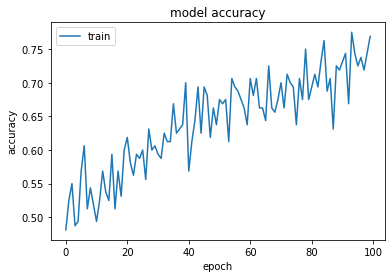

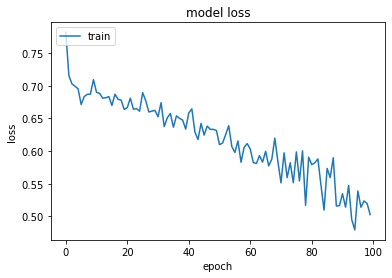

In [393]:
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [397]:
loss, accuracy, f1_score, precision, recall = model.evaluate(np.reshape(np.asarray(X_test_scaled), (40,28,28,1)), y_test, verbose=1)
print(loss, accuracy, f1_score, precision, recall)

40/40 [==============================] - 0s 121us/step
0.615994930267334 0.675000011920929 0.6853448152542114 0.800000011920929 0.6214286088943481
